# Dynamic SSD with Focal Loss
Here I'll be trying out the RetinaNet implementation written by rohitgeo

# Imports  

In [1]:
from apex import amp
amp_handle = amp.init(enabled=True)
%matplotlib inline
import matplotlib.pyplot as plt
import torch
from torch import nn
import torch.nn.functional as F
from ssdoil import *
from ssd import *
from utils import *

# Utils

# Focal Loss
Now the real RetinaNet power comes in where we use the paper's contribution which is the 
Focal loss function where we weight and ds the losses

# SSD Implementation 


# Using The detector on PASCAL data

In [2]:
import pandas as pd
from pathlib import Path

from fastai.vision.transform import get_transforms
from fastai.vision.data import ObjectItemList, imagenet_stats#, bb_pad_collate
from fastai import *
from fastai.vision import *

In [3]:
# PATH = Path(r'/home/m090009/dev/data/PASCAL_VOC/')
# JPEGS = 'VOCdevkit/VOC2007/JPEGImages'
# IMG_PATH = PATH/JPEGS

In [4]:
PATH = Path(r'./Bosch_trafficlight_data/')
JPEGS = 'train/CombinedAnnotatedJPEG'
IMG_PATH = PATH/JPEGS


In [5]:
# images, lbl_bbox  = get_annotations(PATH/'pascal_train2007.json')
# # images_v, lbl_bbox_v  = get_annotations(PATH/'pascal_val2007.json')

# img2bbox = dict(zip(images, lbl_bbox))
# # img2bbox_v = dict(zip(images_v, lbl_bbox_v))
# def get_y_func(x):
#     if x.name in img2bbox:
#         bboxes, classes = img2bbox[x.name]
#     else:
#         bboxes, classes = img2bbox_v[x.name]
#     return [bboxes, classes]

In [6]:
def remove_string_from_name(images, string_to_remove='/home/m090009/dev/CarND-TrafficSignal/Bosch_trafficlight_data/train/JPEGImages/'):
    for i in range(len(images)):
        images[i] = images[i].split('/')[-1]
        if '.png' in images[i]:
            images[i] = images[i].replace('.png', '.jpg') 

In [9]:
images[-1]
len(img2bbox)

8240

In [5]:
def remove_unannotated_images(json_path):
    j = json.load(open(json_path))
    annotated_images = []
    for img in j['images']:
        img_id = img['id']
        matches = list(filter(lambda anno: anno['image_id'] == img_id, j['annotations']))
#         if img['id'] == 5087:
#             print(matches)
        if len(matches) > 0:
            annotated_images.append(img)
    # Write the new images to a new json file 
    new_json = j
    print(len(j['images']))
    new_json['images'] = annotated_images
    print(len(new_json['images']))
    with open(PATH/'annotated_test.json', 'w') as outfile:
        json.dump(new_json, outfile)
        print("Successfully written to a new file :)")

In [8]:
# j1 = json.load(open(PATH/'annotated_train.json'))
# j2 = json.load(open(PATH/'annotated_test.json'))
# for img in j2['images']:


In [9]:
def combine_datasets():
    j_train = json.load(open(PATH/'annotated_train.json'))
    j_test = json.load(open(PATH/'annotated_test.json'))
    new_json = j_train
    # Change the test image ids to combine both datasets
    for img in j_test['images']:
        img['id'] = int(img['id']) + 6000
#         s = img['file_name']
#         s[:-4] + 'test' + s[-4:] 
    for anno in j_test['annotations']:
        anno['image_id'] = int(anno['image_id']) + 6000
        anno['id'] = int(anno['id']) + 11000
#     print(j_test['images'][0])
#     print(j_test['annotations'][-1])
    new_json['images'].extend(j_test['images'])
    print(len(j_train['images']))
    new_json['annotations'].extend(j_test['annotations'])
    print(len(j_train['annotations']))
    
    with open(PATH/'annotated_train_test.json', 'w') as outfile:
        json.dump(new_json, outfile)
        print("Successfully written to a new file :)")
# combine_datasets()

In [10]:
def rename_test_images():
    j_test = json.load(open(PATH/'annotated_test.json'))
    for image in j_test['images']:
        image['file_name'] = image['file_name'][:-9] + 'test_' + image['file_name'][-9:]
    with open(PATH/'annotated_test.json', 'w') as outfile:
        json.dump(j_test, outfile)
        print("Successfully written to a new file :)")
# rename_test_images()

In [11]:
#str(PATH)
# import os
# l = os.listdir(str(PATH/'test/AnnotatedJPEG'))
# os.rename(l[0], l[0].replace('.jpg', '_t.jpg'))
# dir = "./"+str(PATH/'test/AnnotatedJPEG/')
# [os.rename(dir+f, dir+f.replace('.jpg', '_t.jpg')) for f in os.listdir(dir) if not f.startswith('.')]

import glob, os

def rename(dir, pattern, titlePattern):
    for pathAndFilename in glob.iglob(os.path.join(dir, pattern)):
        title, ext = os.path.splitext(os.path.basename(pathAndFilename))
        os.rename(pathAndFilename, 
                  os.path.join(dir, titlePattern % title + ext))

In [12]:
# rename(PATH/'test/AnnotatedJPEG/', '*.jpg', r'test_%s')

In [47]:
# remove_unannotated_images(PATH/'train_coco.json')
# remove_unannotated_images(PATH/'test_coco.json')

8334
7147
Successfully written to a new file :)


In [10]:
print("Total: {}, Train: {}, Val: {}".format(len(images), len(train_images), len(val_images)))


Total: 10300, Train: 8240, Val: 2060


## Copy annotated images

In [16]:
# len(t_images)
# t_images[0]

In [17]:
import shutil
def combine_train_test():
    to_file = str(PATH / 'train/CombinedAnnotatedJPEG/')
    test_images = os.listdir(str(PATH/'test/AnnotatedJPEG'))
    train_images = os.listdir(str(PATH/'train/tt'))
    for image in train_images:
#         from_folder = str(PATH / 'train/JPEGImages')
        shutil.copy(str(PATH / 'train/AnnotatedJPEG/{}'.format(image)), str(to_file))
    for image in test_images:
#         from_folder = str(PATH / 'test/JPEGImages')
        shutil.copy(str(PATH / 'test/AnnotatedJPEG/{}'.format(image)), str(to_file))
# combine_train_test()

In [14]:

im_path = PATH /JPEGS / "594608.jpg"
img = open_image(im_path)
def check_y_func():
    lbls = []
    for image in train_images:
        im_path = PATH /JPEGS / image
        lbl = get_y_func(im_path)
        lbls.append(lbl)
    return lbls
print(len(check_y_func()))
# print(lbl)
# bbox = ImageBBox.create(*img.size, lbl[0], labels=range(len(lbl[1])), classes=lbl[1])
# print(lbl[0][0])
# _, axs = plt.subplots(1,1,figsize=(12,12))

# img.show(ax=axs, y=bbox)

8240


In [7]:
from sklearn.model_selection import train_test_split
images, lbl_bbox  = get_annotationss(PATH/'annotated_train.json')
# images, lbl_bbox  = get_annotationss(PATH/'annotated_train_test.json')
# t_images, t_lbl_bbox  = get_annotationss(PATH/'annotated_test.json')
remove_string_from_name(images)
# remove_string_from_name(t_images, '/home/m090009/dev/CarND-TrafficSignal/Bosch_trafficlight_data/test/JPEGImages/')

train_images, val_images, train_lbl_bbox, val_lbl_bbox = train_test_split(images, lbl_bbox, test_size=0.20, random_state=42)

img2bbox = dict(zip(train_images, train_lbl_bbox))
# img2bbox = dict(zip(images, lbl_bbox))
img2bbox_v = dict(zip(val_images, val_lbl_bbox))
# img2bbox_t = dict(zip(t_images, t_lbl_bbox))
def get_y_func(x):
    if x.name in img2bbox:
        bboxes, classes = img2bbox[x.name]
#     elif x.name in img2bbox_t:
#         bboxes, classes = img2bbox_t[x.name]
    else:
        bboxes, classes = img2bbox_v[x.name]
    return [bboxes, classes]

In [8]:
def bb_pad_collate(samples:BatchSamples, pad_idx:int=0) -> Tuple[FloatTensor, Tuple[LongTensor, LongTensor]]:
    "Function that collect `samples` of labelled bboxes and adds padding with `pad_idx`."
    if isinstance(samples[0][1], int): return data_collate(samples)
    max_len = max([len(s[1].data[1]) for s in samples])
    bboxes = torch.zeros(len(samples), max_len, 4)
    labels = torch.zeros(len(samples), max_len).long() + pad_idx
    imgs = []
    for i,s in enumerate(samples):
        imgs.append(s[0].data[None])
        bbs, lbls = s[1].data
        if not (bbs.nelement() == 0):
            bboxes[i,-len(lbls):] = bbs
            labels[i,-len(lbls):] = tensor(lbls)
    return torch.cat(imgs,0), (bboxes,labels)

In [9]:
BS = 490

In [10]:
len(val_images)

631

In [11]:

from ssdoil import SSDObjectItemList
%time
JPEGS = 'train/AnnotatedJPEG'
data = (SSDObjectItemList.from_folder(PATH/JPEGS)
        .split_by_files(val_images)                             
        .label_from_func(get_y_func)
        .transform(get_transforms(), tfm_y=True, size=224)
        .databunch(bs=BS, collate_fn=bb_pad_collate)
        .normalize(imagenet_stats))

CPU times: user 3 µs, sys: 1 µs, total: 4 µs
Wall time: 6.68 µs


CPU times: user 913 ms, sys: 1e+03 ms, total: 1.91 s
Wall time: 34.8 s


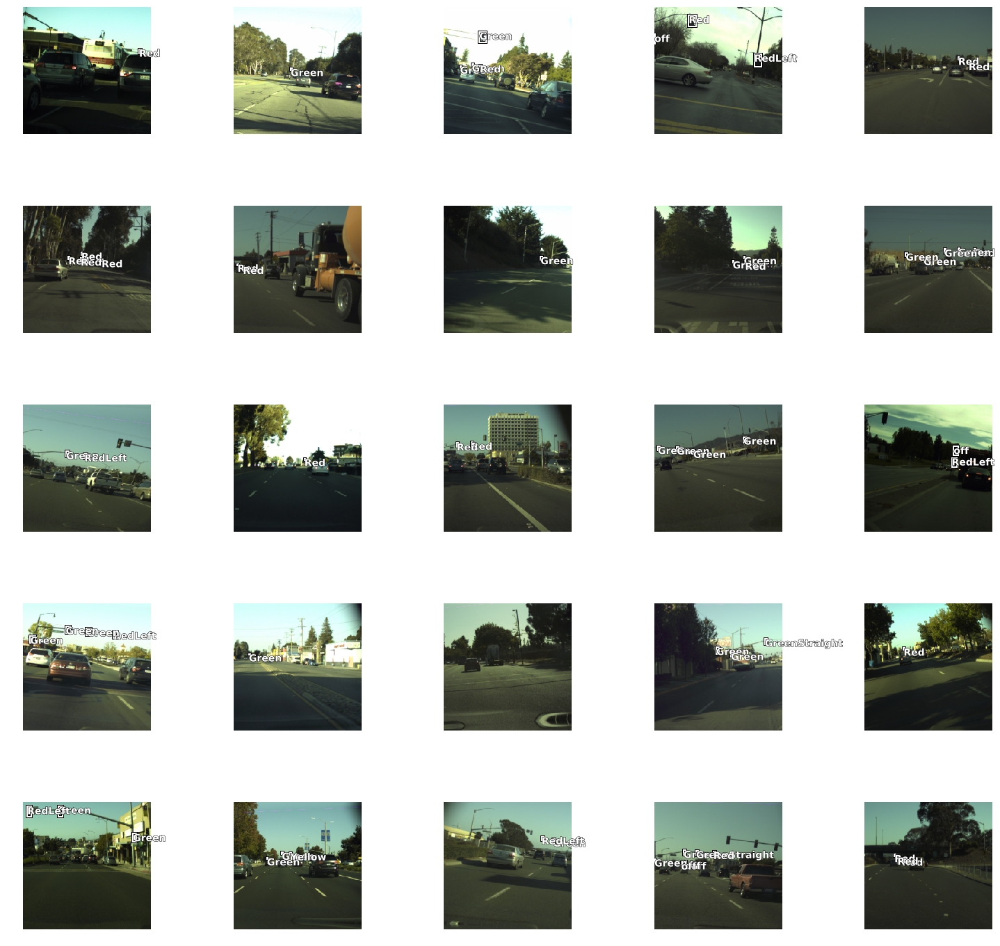

In [27]:
%%time
data.show_batch()

# BCE Model

In [25]:
ssd_model = SingleShotDetector(data)

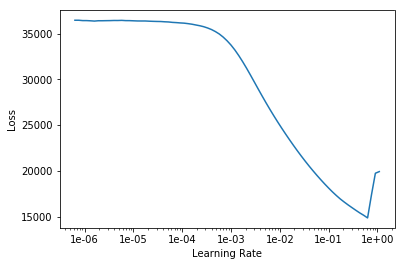

In [27]:
ssd_model.lr_find()

In [28]:

ssd_model.fit(20, lr=slice(1e-3, 1e-2))

epoch,train_loss,valid_loss
1,11134.830078,1494.225586
2,5433.714355,499.683502
3,3439.080811,385.178192
4,2451.107422,325.302063
5,1866.018799,312.749542
6,1484.072388,295.399689
7,1217.615967,280.589417
8,1023.022156,278.433197
9,877.252075,278.005402
10,764.781982,272.261108


## Save the Model

In [29]:
ssd_model.save('ssd-tl-BCE-20')

## Show some results 

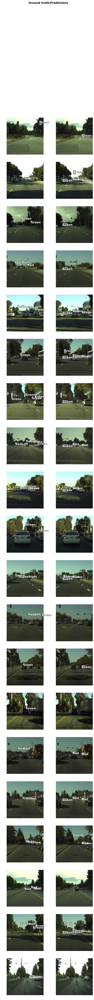

In [30]:
ssd_model.show_results(rows=20, thresh=0.1)

# Focal Loss Model

In [14]:
max_lr = 1e-3
lrs = np.array([max_lr/100, max_lr/10, max_lr])

In [13]:
ssd_model = SingleShotDetector(data, focal_loss=True, pretrained_path='ssd-tl-FL-415')

## Export Model

In [16]:
ssd_model.learn.export()

In [17]:
ssd_model.learn.path

PosixPath('Bosch_trafficlight_data/train/AnnotatedJPEG')

In [28]:
ssd_model.fit(15, lr=lrs)

epoch,train_loss,valid_loss
1,50.068634,46.293182
2,50.103565,46.051182
3,50.059246,45.945702
4,50.223190,46.735867
5,50.337475,46.071640
6,50.387207,45.692078
7,50.330486,45.798508
8,50.341339,45.920063
9,50.266758,45.557632
10,50.298672,45.677334


Gradient overflow, skipping update


## Save the Model

In [29]:
ssd_model.save('ssd-tl-FL-340')

## Stage 2

In [30]:
ssd_model.learn.freeze_to(-1)
lrs = np.array([max_lr/100, max_lr/10, max_lr])
ssd_model.fit(15, lrs/2)

epoch,train_loss,valid_loss
1,49.280418,45.082230
2,49.331635,45.165371
3,49.493477,45.062931
4,49.419220,45.126221
5,49.374031,45.087696
6,49.303101,44.963673
7,49.170559,45.030594
8,49.147289,45.125862
9,49.173706,45.045109
10,49.126892,45.038391


## Stage 3

In [31]:
ssd_model.learn.freeze_to(-2)
ssd_model.learn.fit(15, lrs/2)

epoch,train_loss,valid_loss
1,48.623264,45.503025
2,48.742077,45.995319
3,48.809635,45.368439
4,48.761967,45.195652
5,48.792328,45.319077
6,48.762695,45.496422
7,48.770691,45.143242
8,48.690708,45.112762
9,48.581207,45.041290
10,48.494839,44.989590


## Stage 4

In [32]:
ssd_model.learn.freeze_to(0)
ssd_model.learn.fit(15, lrs/4)

epoch,train_loss,valid_loss
1,48.147991,44.771984
2,47.898548,44.659939
3,47.969948,44.674545
4,47.941727,44.605247
5,47.885445,44.706203
6,47.806606,44.600590
7,47.639366,44.578438
8,47.548313,44.550533
9,47.468975,44.520847
10,47.410484,44.729099


## Stage 5

In [33]:
ssd_model.learn.freeze_to(0)
ssd_model.learn.fit(15, lrs/5)

epoch,train_loss,valid_loss
1,47.411442,44.493477
2,47.123512,44.539940
3,47.051392,44.429035
4,47.062759,44.469604
5,47.066021,44.416500
6,47.055897,44.464973
7,46.949799,44.394730
8,46.923325,44.482826
9,46.837784,44.307816
10,46.835266,44.273567


## Stage 6

In [34]:
ssd_model.learn.freeze_to(0)
ssd_model.learn.fit(15, lrs/5)

epoch,train_loss,valid_loss
1,46.846928,44.568417
2,46.784081,44.264954
3,46.608669,44.574104
4,46.640240,44.209030
5,46.597458,44.125156
6,46.542519,44.181091
7,46.557224,44.317253
8,46.566986,44.132759
9,46.592911,44.260757
10,46.615402,44.353767


In [35]:
ssd_model.save('ssd-tl-FL-415')

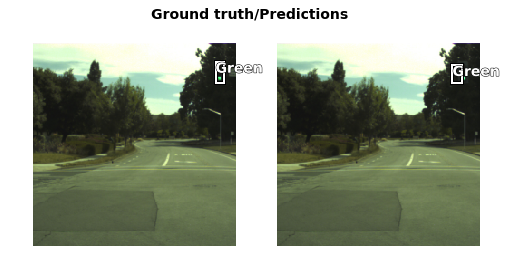

In [42]:
ssd_model.show_results(rows=1, thresh=0.28)

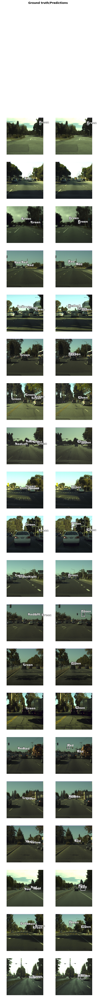

In [36]:
ssd_model.show_results(rows=20, thresh=0.3)

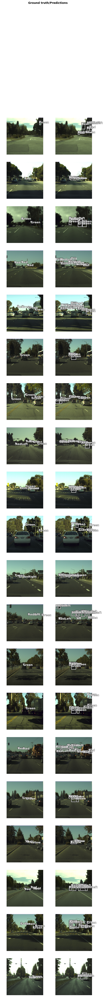

In [37]:
ssd_model.show_results(rows=20, thresh=0.1)

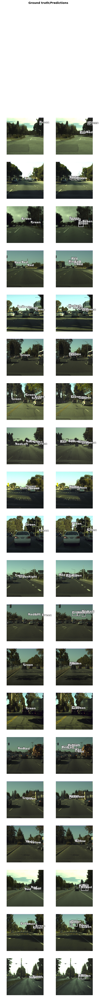

In [38]:
ssd_model.show_results(rows=20, thresh=0.2)

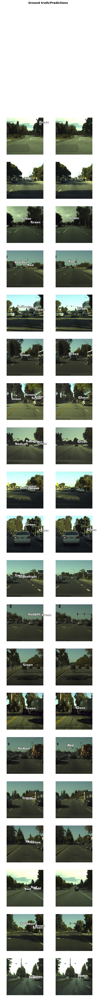

In [39]:
ssd_model.show_results(rows=20, thresh=0.4)

In [22]:
ssd_model.save('ssd-pascal-FL-20')

In [83]:
trn_tfms, val_tfms = tfms_from_model(resnet34, 224)
im = val_tfms(Image.open(PATH/'train/test1.jpg'))
ssd_model.learn.precompute = False
preds = ssd_model_array(im[None])
# np.argmax(preds)

NameError: name 'tfms_from_model' is not defined

## Show some results 

# Improve the result using feature pyramid